In [1]:
import pandas as pd
from sklearn.model_selection import GridSearchCV
from sklearn import metrics
from sklearn.ensemble import RandomForestClassifier
from sklearn import svm
from sklearn.preprocessing import RobustScaler
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.feature_selection import SelectKBest, f_classif

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
from imblearn.over_sampling import RandomOverSampler

In [3]:
from imblearn.under_sampling import RandomUnderSampler

In [4]:
from imblearn.over_sampling import SMOTE

In [5]:
from imblearn.pipeline import Pipeline as iPipeline

In [6]:
from sklearn.model_selection import cross_val_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier

In [7]:
import shap

Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)


In [8]:
import seaborn as sns
import matplotlib.pyplot as plt

# Helping Functions

In [9]:
import pickle

In [10]:
def saveModel(fileName,model):
    with open(f'{fileName}.pickle',"wb") as file:
        pickle.dump(model,file)

In [11]:
def loadModel(modelFile):
    with open(modelFile, 'rb') as file:
        model = pickle.load(file)
        return model

# Load the data

In [12]:
# Load the train data
train_data = pd.read_csv('/kaggle/input/speech-based-classification-layer-9/train.csv')

In [13]:
train_data

,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,...,feature_763,feature_764,feature_765,feature_766,feature_767,feature_768,label_1,label_2,label_3,label_4
0,0.019301,0.059756,0.081375,0.057481,-0.068440,-0.165913,0.035643,-0.091138,0.021688,0.057158,...,-0.035576,0.127319,0.098128,-0.058787,0.100971,-0.047754,45,NaN,1,6
1,0.049741,0.090030,0.035118,-0.013676,-0.194317,-0.101763,0.085875,-0.081317,0.112418,0.120523,...,0.020538,0.058968,0.029803,0.111324,0.036727,0.031927,45,NaN,1,6
2,0.019212,0.087779,0.093907,-0.033738,-0.141409,-0.062881,-0.071402,-0.006599,0.020372,-0.027777,...,0.119645,-0.040861,0.000548,-0.061003,-0.042450,0.063340,45,NaN,1,6
3,0.070283,0.049040,0.042126,0.122637,-0.056964,-0.113700,0.108454,0.051336,0.086610,0.141578,...,-0.124494,-0.169225,-0.046391,0.148787,0.014616,-0.140644,45,NaN,1,6
4,0.028864,0.165634,0.016302,0.036117,-0.028871,-0.147748,0.053180,0.025071,-0.004200,-0.022183,...,-0.124862,0.044907,0.084005,-0.038450,0.084371,-0.072146,45,NaN,1,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28515,-0.041520,0.302638,0.004811,0.211441,-0.249326,-0.113395,-0.146776,-0.146222,-0.040344,-0.124016,...,0.290069,-0.223051,-0.053575,-0.230222,-0.451943,0.117817,39,29.0,1,6
28516,-0.056359,0.061850,0.051865,0.032107,-0.005930,-0.040313,0.117453,-0.067553,0.045004,0.035735,...,0.004518,0.035248,-0.047345,-0.006539,-0.025633,0.002474,39,29.0,1,6
28517,0.019361,0.148111,0.093434,0.011795,-0.074029,-0.077628,0.049933,-0.096354,0.138556,0.130414,...,0.014918,0.015676,-0.033608,0.068212,0.049871,-0.027607,39,29.0,1,6
28518,-0.043644,0.084073,0.074749,0.091776,-0.090782,-0.163187,-0.012568,-0.051021,0.038726,0.011009,...,-0.098420,0.113067,0.028218,0.036682,0.030056,-0.084346,39,29.0,1,6


In [14]:
# Load the valid data
valid_data = pd.read_csv('/kaggle/input/speech-based-classification-layer-9/valid.csv')

In [15]:
valid_data

,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,...,feature_763,feature_764,feature_765,feature_766,feature_767,feature_768,label_1,label_2,label_3,label_4
0,-0.130454,0.103857,0.130866,-0.036366,-0.152212,-0.072316,-0.041838,-0.019596,0.038727,0.022496,...,0.129246,0.018913,0.013387,-0.054259,0.006282,0.049646,45,NaN,1,6
1,0.019179,0.104888,0.079487,0.005187,-0.134111,-0.109271,0.054558,-0.083966,-0.000091,0.083015,...,-0.031823,0.061069,0.036411,0.101357,0.088504,0.008192,45,NaN,1,6
2,-0.028485,0.051889,0.033343,-0.029115,-0.091265,-0.038653,0.113460,-0.057983,0.128808,0.062455,...,-0.033106,-0.007366,-0.027673,0.052090,0.044097,0.054422,45,NaN,1,6
3,-0.078959,0.082325,0.068852,-0.028885,-0.146059,-0.071453,-0.028955,0.031253,0.034923,0.019338,...,0.164456,-0.025891,0.037993,0.012060,-0.044266,0.045405,45,NaN,1,6
4,0.001748,0.050968,-0.034524,0.074153,0.063857,-0.133338,0.102604,-0.031676,0.010629,-0.018684,...,-0.102749,0.022433,0.018421,0.086064,0.075351,-0.067089,45,NaN,1,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
745,-0.015146,0.075347,-0.067940,0.018324,-0.009130,-0.078199,0.019046,0.054832,0.057062,-0.041307,...,-0.037656,0.014558,-0.006257,0.114661,-0.020831,0.043870,39,29.0,1,6
746,-0.093367,0.090779,-0.014720,0.060278,-0.054997,0.012507,0.138347,0.064434,0.021669,0.038423,...,-0.102469,-0.012509,-0.024472,-0.082420,-0.018768,-0.091912,39,29.0,1,6
747,0.036313,0.053569,-0.040507,0.084671,-0.047545,-0.127989,0.048077,0.038251,0.058703,0.012898,...,-0.139285,-0.020544,-0.086482,0.202496,-0.089369,-0.052960,39,29.0,1,6
748,0.002803,0.127188,0.091111,-0.024576,-0.044046,-0.065907,-0.019063,-0.062951,0.066077,0.058489,...,0.055279,-0.014534,0.014749,0.017866,-0.008768,-0.017424,39,29.0,1,6


In [16]:
# Load the valid data
test_data = pd.read_csv('/kaggle/input/speech-based-classification-layer-9/test.csv')

In [17]:
test_data

,ID,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,...,feature_759,feature_760,feature_761,feature_762,feature_763,feature_764,feature_765,feature_766,feature_767,feature_768
0,1,0.013112,0.130904,0.020284,0.063018,-0.034321,-0.073516,-0.030659,-0.064994,0.024153,...,0.037803,0.241121,0.079949,-0.186099,-0.096718,0.126006,-0.023069,0.190374,0.146516,0.038047
1,2,0.005934,0.138592,-0.007000,0.055925,-0.021927,-0.084788,0.013339,0.060811,-0.011344,...,-0.098701,0.042921,0.018571,-0.114785,-0.105186,0.059050,0.021443,0.013027,0.046826,-0.026682
2,3,-0.067210,0.078710,-0.044344,0.101248,-0.074331,-0.088951,0.074616,0.007231,0.021091,...,0.029569,0.053370,0.096232,-0.369018,-0.066708,-0.003730,-0.063339,-0.044497,-0.024363,-0.042594
3,4,-0.005678,0.060703,0.033954,0.068771,-0.039923,-0.186583,0.014921,0.020791,0.017441,...,-0.095406,0.018405,-0.018047,-0.080393,-0.114030,0.048255,0.033839,0.035026,-0.047988,-0.038252
4,5,-0.076360,0.061095,-0.004938,0.066692,-0.040454,-0.005141,-0.003213,0.025721,0.083558,...,-0.003129,0.045479,0.057146,-0.194466,0.000739,0.018702,0.013192,-0.038486,0.033358,-0.038452
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
739,740,-0.041863,0.126622,0.114024,0.079883,-0.115374,-0.062802,-0.153936,-0.013027,0.023246,...,-0.259316,0.028684,0.237552,-0.060189,0.210614,-0.054000,0.011984,-0.111881,-0.147075,0.117923
740,741,-0.079001,0.037629,0.098682,0.029443,0.009175,-0.054438,-0.004389,-0.012019,0.069845,...,-0.058815,0.045824,0.043017,-0.015863,-0.024182,0.075286,-0.039734,-0.009528,-0.009277,0.024535
741,742,-0.037470,0.030891,0.036820,0.009119,-0.019754,-0.021159,-0.050765,-0.088520,0.056325,...,0.000069,0.044224,0.079521,-0.077634,-0.017341,-0.021590,-0.021365,-0.060363,0.053465,0.039498
742,743,-0.019768,0.054041,0.083453,0.006207,-0.052371,-0.073792,0.030196,-0.069850,0.143673,...,-0.080863,0.056737,0.005435,-0.097375,-0.010913,-0.004906,-0.025309,0.004230,-0.028945,0.053553


In [18]:
# Split data into features (X) and labels (Y) for each label for train dataset
X_train = train_data.loc[:, 'feature_1':'feature_768']
Y_speaker_train = train_data['label_1']
Y_age_train = train_data['label_2']
Y_gender_train = train_data['label_3']
Y_accent_train = train_data['label_4']

In [19]:
# Split data into features (X) and labels (Y) for each label for valid dataset
X_valid = valid_data.loc[:, 'feature_1':'feature_768']
Y_speaker_valid = valid_data['label_1']
Y_age_valid = valid_data['label_2']
Y_gender_valid = valid_data['label_3']
Y_accent_valid = valid_data['label_4']

In [20]:
X_train

,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,...,feature_759,feature_760,feature_761,feature_762,feature_763,feature_764,feature_765,feature_766,feature_767,feature_768
0,0.019301,0.059756,0.081375,0.057481,-0.068440,-0.165913,0.035643,-0.091138,0.021688,0.057158,...,-0.108481,0.124449,0.124765,-0.235671,-0.035576,0.127319,0.098128,-0.058787,0.100971,-0.047754
1,0.049741,0.090030,0.035118,-0.013676,-0.194317,-0.101763,0.085875,-0.081317,0.112418,0.120523,...,-0.025115,0.186260,0.085101,-0.365903,0.020538,0.058968,0.029803,0.111324,0.036727,0.031927
2,0.019212,0.087779,0.093907,-0.033738,-0.141409,-0.062881,-0.071402,-0.006599,0.020372,-0.027777,...,-0.058567,0.019542,0.144256,-0.123374,0.119645,-0.040861,0.000548,-0.061003,-0.042450,0.063340
3,0.070283,0.049040,0.042126,0.122637,-0.056964,-0.113700,0.108454,0.051336,0.086610,0.141578,...,-0.124006,0.117235,-0.038984,-0.028714,-0.124494,-0.169225,-0.046391,0.148787,0.014616,-0.140644
4,0.028864,0.165634,0.016302,0.036117,-0.028871,-0.147748,0.053180,0.025071,-0.004200,-0.022183,...,-0.112267,0.029716,0.077643,-0.182132,-0.124862,0.044907,0.084005,-0.038450,0.084371,-0.072146
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28515,-0.041520,0.302638,0.004811,0.211441,-0.249326,-0.113395,-0.146776,-0.146222,-0.040344,-0.124016,...,-0.187994,0.008503,0.182576,0.120671,0.290069,-0.223051,-0.053575,-0.230222,-0.451943,0.117817
28516,-0.056359,0.061850,0.051865,0.032107,-0.005930,-0.040313,0.117453,-0.067553,0.045004,0.035735,...,-0.091158,0.035233,0.015577,-0.196307,0.004518,0.035248,-0.047345,-0.006539,-0.025633,0.002474
28517,0.019361,0.148111,0.093434,0.011795,-0.074029,-0.077628,0.049933,-0.096354,0.138556,0.130414,...,-0.126919,0.053814,0.088694,-0.018453,0.014918,0.015676,-0.033608,0.068212,0.049871,-0.027607
28518,-0.043644,0.084073,0.074749,0.091776,-0.090782,-0.163187,-0.012568,-0.051021,0.038726,0.011009,...,-0.065889,0.057651,0.035704,-0.015049,-0.098420,0.113067,0.028218,0.036682,0.030056,-0.084346


Now lets find best classification model for each label. Lets classify Label 1 first.

# Find best classifier model for Label 1

Check the nature of Label 1

In [20]:
Y_speaker_train.describe()

count    28520.000000
mean        30.498843
std         17.328389
min          1.000000
25%         15.000000
50%         30.000000
75%         46.000000
max         60.000000
Name: label_1, dtype: float64

Remove outliers if there are any of them

In [21]:
robustScaler= RobustScaler()
X_train = pd.DataFrame(robustScaler.fit_transform(X_train))
X_valid = pd.DataFrame(robustScaler.fit_transform(X_valid))

Next check are there any null values in the Label 1 column.

In [22]:
Y_speaker_train_df = Y_speaker_train.to_frame()

In [23]:
null_values = Y_speaker_train_df['label_1'].isnull()
null_count = null_values.sum()

print(f"Number of null values in 'label_1': {null_count}")

Number of null values in 'label_1': 0


Therefore there is not any null values.
Now Let's check the value distribution with a graph.

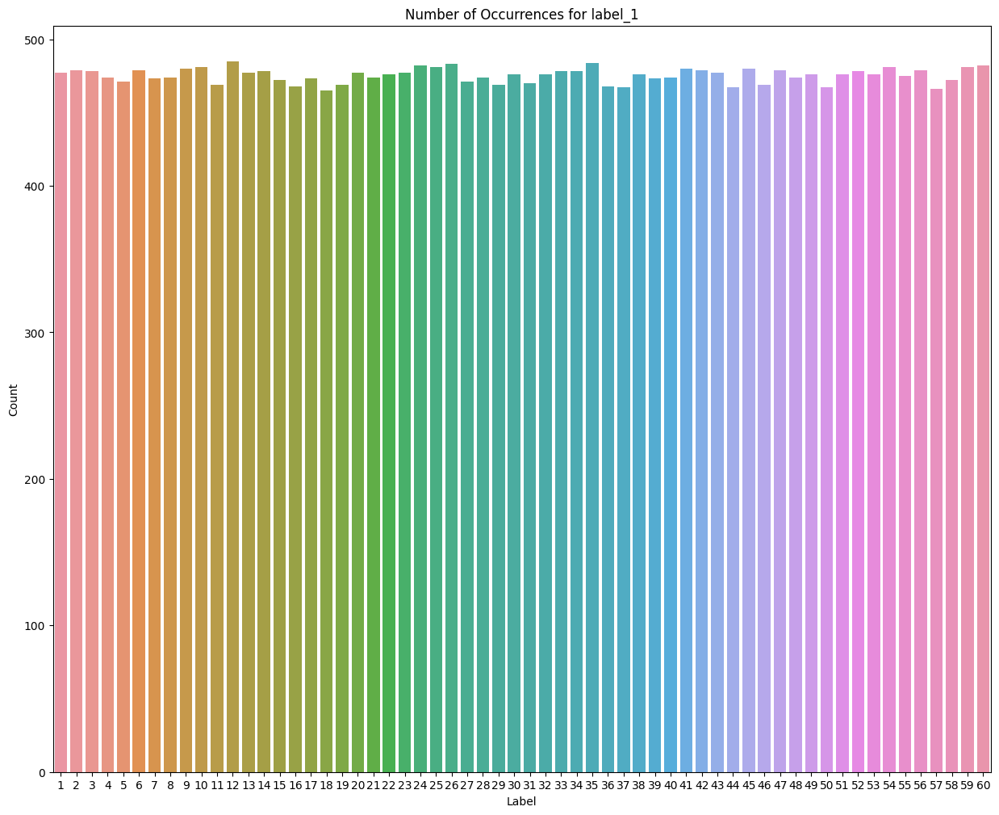

In [24]:
# Create a countplot using Seaborn
plt.figure(figsize=(15, 12))
sns.countplot(data=Y_speaker_train_df, x='label_1')
plt.xlabel('Label')
plt.ylabel('Count')
plt.title('Number of Occurrences for label_1')
plt.show()

No bias in the dataset.

Now check the correlation between the features

In [25]:
X_train_label_1 = X_train.copy()
X_valid_label_1 = X_valid.copy()
X_test_label_1 = test_data.loc[:, 'feature_1':'feature_768'].copy()

In [26]:
corr_before_feature_engineering_label_1 = X_train_label_1.corr()

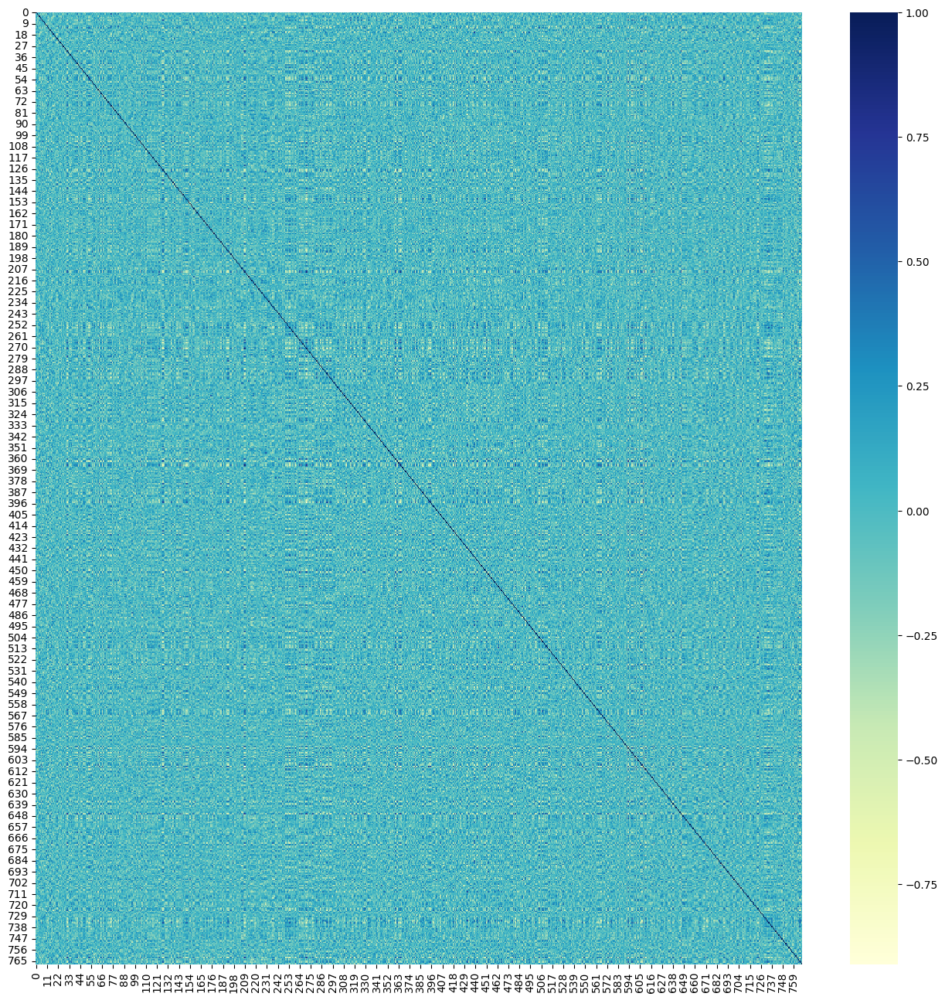

In [27]:
plt.figure(figsize=(16, 16))
plt.xticks(rotation=90)
sns.heatmap(corr_before_feature_engineering_label_1, cmap="YlGnBu")
plt.savefig("All_data.png")

Now lets find best classifier model to predict Label 1

In [29]:
score_knn = cross_val_score(KNeighborsClassifier(n_neighbors=10), X_train_label_1, Y_speaker_train,cv=3)
score_svm = cross_val_score(svm.SVC(kernel='linear', probability=True, class_weight='balanced'),X_train_label_1, Y_speaker_train,cv=3)
score_rfc = cross_val_score(RandomForestClassifier(n_estimators=10),X_train_label_1, Y_speaker_train, cv=3)
print(f"score for knn: {score_knn}")
print(f"score for svm: {score_svm}")
print(f"score_rfc:{score_rfc}")

score for knn: [0.84011781 0.84706006 0.83578792]
score for svm: [0.94456716 0.93878195 0.94445613]
score_rfc:[0.48196066 0.4882718  0.49884284]


Therefore SVM has the best accuracy

Now lets predict with SVC model

In [28]:
svc_label_1 = svm.SVC(kernel='linear')
svc_label_1.fit(X_train_label_1, Y_speaker_train_df)

/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


SVC(kernel='linear')

In [29]:
y_predict_label_1 = svc_label_1.predict(X_valid_label_1)

In [30]:
print(metrics.confusion_matrix(Y_speaker_valid, y_predict_label_1))
print(metrics.accuracy_score(Y_speaker_valid, y_predict_label_1))
print(metrics.precision_score(Y_speaker_valid, y_predict_label_1, average = 'weighted'))
print(metrics.recall_score(Y_speaker_valid, y_predict_label_1, average = 'weighted'))

[[11  0  0 ...  0  0  0]
 [ 0  8  0 ...  0  0  0]
 [ 0  0 12 ...  0  0  0]
 ...
 [ 0  0  0 ... 20  0  0]
 [ 0  0  0 ...  0 10  0]
 [ 0  0  0 ...  0  0 10]]
0.9533333333333334
0.9581148048832259
0.9533333333333334


Lets do the hyper parameter tuning and find the best model by changing the parameters. I use PCA for feature reduction task.

In [31]:
# Create a pipeline with PCA, SVM, and grid search for hyperparameter tuning
pipeline = Pipeline([
    ('pca', PCA()),
    ('svm', svm.SVC())
])

Check by changinge following parameters

In [32]:
# Define the parameter grid for grid search
param_grid = {
    'pca__n_components': [0.94],  # Number of principal components to retain
    'svm__C': [0.1, 1, 10, 28, 30],         # SVM regularization parameter
    'svm__kernel': ['linear', 'rbf']         # SVM kernel
}

In [33]:
# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, cv=3, scoring='accuracy')
grid_search.fit(X_train, Y_speaker_train)

GridSearchCV(cv=3, estimator=Pipeline(steps=[('pca', PCA()), ('svm', SVC())]),
             param_grid={'pca__n_components': [0.94], 'svm__C': [28],
                         'svm__kernel': ['linear', 'rbf']},
             scoring='accuracy')

In [34]:
# Get the best model and its hyperparameters
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_
best_score = grid_search.best_score_

In [35]:
best_params

{'pca__n_components': 0.94, 'svm__C': 28, 'svm__kernel': 'rbf'}

In [36]:
# Evaluate the best model on the test set
accuracy = best_model.score(X_valid, Y_speaker_valid)

In [37]:
y_pred_with_grid_search_label_1 = best_model.predict(X_valid)

In [40]:
print(metrics.confusion_matrix(Y_speaker_valid, y_pred_with_grid_search_label_1))
print(metrics.accuracy_score(Y_speaker_valid, y_pred_with_grid_search_label_1))
print(metrics.precision_score(Y_speaker_valid, y_pred_with_grid_search_label_1, average = 'weighted'))
print(metrics.recall_score(Y_speaker_valid, y_pred_with_grid_search_label_1, average = 'weighted'))

[[13  0  0 ...  0  0  0]
 [ 0  9  0 ...  0  0  0]
 [ 0  0 12 ...  0  0  0]
 ...
 [ 0  0  0 ... 20  0  0]
 [ 0  0  0 ...  0 10  0]
 [ 0  0  0 ...  0  0 10]]
0.96
0.9626764656396235
0.96


Use explainable AI

In [39]:
def svc_predictor_label_1(X):
    return best_model.decision_function(X)

In [ ]:
explainer_label_1 = shap.Explainer(svc_predictor_label_1, X_train_label_1)
shap_values_label_1 = explainer_label_1.shap_values(X_valid_label_1)
shap.summary_plot(shap_values_label_1, X_valid_label_1, feature_names=X.columns)

In [41]:
saveModel("best_pca__n_0.94_svm__C_28_svm__kernel_rbf", best_model)

Create CSV output file

In [42]:
y_predict_final_label_1 = best_model.predict(X_test_label_1)

/opt/conda/lib/python3.10/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but PCA was fitted without feature names
  warnings.warn(


In [43]:
y_predict_final_label_1.shape

(744,)

In [44]:
y_predict_final_label_1_series = pd.Series(y_predict_final_label_1, name='Predicted_Label_1')

In [45]:
final_result_label_1 = pd.concat([test_data['ID'], y_predict_final_label_1_series], axis=1)
final_result_label_1

,ID,Predicted_Label_1
0,1,29
1,2,29
2,3,29
3,4,31
4,5,31
...,...,...
739,740,1
740,741,31
741,742,25
742,743,31


In [46]:
final_result_label_1.to_csv('190050K layer 9 label 1.csv', index=False)

Let find classification model for Label 2

# Find best classifier model for Label 2

Check the nature of Label 2

In [47]:
Y_age_train.describe()

count    28040.000000
mean        27.975107
std          5.735913
min         22.000000
25%         25.000000
50%         27.000000
75%         30.000000
max         61.000000
Name: label_2, dtype: float64

In [48]:
robustScaler= RobustScaler()
X_train = pd.DataFrame(robustScaler.fit_transform(X_train))
X_valid = pd.DataFrame(robustScaler.fit_transform(X_valid))

Next check are there any null values in the Label 2 column.

In [49]:
Y_age_train_df = Y_age_train.to_frame()

In [50]:
null_values = Y_age_train_df['label_2'].isnull()
null_count = null_values.sum()

print(f"Number of null values in 'label_2': {null_count}")

Number of null values in 'label_2': 480


In [51]:
print(f"Percentage of null values in 'label_2': {null_count/X_train.shape[0]*100}%")

Percentage of null values in 'label_2': 1.6830294530154277%


Therefore the percentage of NULL values are low. Therefore I can elemenate these rows for future calculations.

In [52]:
preprocessed_train_data = train_data[train_data['label_2'].notna()]
preprocessed_valid_data = valid_data[train_data['label_2'].notna()]

/tmp/ipykernel_29/799142066.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  preprocessed_valid_data = valid_data[train_data['label_2'].notna()]


In [53]:
preprocessed_train_data

,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,...,feature_763,feature_764,feature_765,feature_766,feature_767,feature_768,label_1,label_2,label_3,label_4
480,-0.037427,0.068284,-0.100538,0.076783,-0.113147,-0.079453,0.106947,0.011906,-0.047519,0.022915,...,-0.035784,0.033521,-0.025551,0.083790,-0.027678,-0.008546,5,25.0,1,6
481,0.024931,0.045966,0.016385,0.028214,-0.092396,-0.053490,-0.018101,0.053902,0.080196,0.010693,...,-0.001359,0.019178,0.068597,0.066214,0.141953,0.075839,5,25.0,1,6
482,0.025077,0.082511,0.074441,0.124308,-0.037937,-0.089271,0.012489,-0.036005,-0.023984,-0.010576,...,-0.095350,0.087392,0.007523,0.030705,0.086901,0.031186,5,25.0,1,6
483,0.030733,0.060249,0.099119,0.087801,-0.035729,-0.152115,0.032606,0.024821,0.032655,0.053826,...,-0.091252,0.031182,-0.034731,0.004988,0.143666,-0.012354,5,25.0,1,6
484,0.012062,0.068691,0.051343,0.049753,0.006491,-0.107100,0.076212,0.004650,0.113739,0.004015,...,-0.025445,0.062129,-0.034741,0.042223,-0.024982,0.132500,5,25.0,1,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28515,-0.041520,0.302638,0.004811,0.211441,-0.249326,-0.113395,-0.146776,-0.146222,-0.040344,-0.124016,...,0.290069,-0.223051,-0.053575,-0.230222,-0.451943,0.117817,39,29.0,1,6
28516,-0.056359,0.061850,0.051865,0.032107,-0.005930,-0.040313,0.117453,-0.067553,0.045004,0.035735,...,0.004518,0.035248,-0.047345,-0.006539,-0.025633,0.002474,39,29.0,1,6
28517,0.019361,0.148111,0.093434,0.011795,-0.074029,-0.077628,0.049933,-0.096354,0.138556,0.130414,...,0.014918,0.015676,-0.033608,0.068212,0.049871,-0.027607,39,29.0,1,6
28518,-0.043644,0.084073,0.074749,0.091776,-0.090782,-0.163187,-0.012568,-0.051021,0.038726,0.011009,...,-0.098420,0.113067,0.028218,0.036682,0.030056,-0.084346,39,29.0,1,6


In [54]:
preprocessed_valid_data

,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,...,feature_763,feature_764,feature_765,feature_766,feature_767,feature_768,label_1,label_2,label_3,label_4
480,-0.047031,0.041947,0.056951,0.047926,-0.089118,-0.132856,0.030008,-0.038914,0.029798,0.031058,...,-0.040949,0.063267,0.059582,0.041823,0.105365,-0.056804,59,31.0,0,6
481,-0.052911,0.098921,0.121741,0.089484,-0.145345,-0.112196,0.079752,0.055970,-0.007839,0.060113,...,-0.149301,0.067381,-0.012897,0.025470,0.078393,-0.063890,50,24.0,1,6
482,0.011507,-0.012617,-0.076403,0.086147,-0.051803,-0.120510,0.036904,0.035811,0.093503,0.084607,...,-0.168115,-0.081103,-0.012853,0.063982,0.055635,-0.052485,50,24.0,1,6
483,-0.069838,0.091155,0.066099,0.106601,-0.232203,-0.171722,0.189841,0.004873,-0.058552,0.068429,...,-0.115503,-0.066955,0.055088,0.233395,0.070820,0.078391,50,24.0,1,6
484,0.030415,0.082389,0.031555,0.118601,-0.034911,-0.244303,0.063292,-0.096438,0.121225,-0.052829,...,-0.145705,0.159676,0.084638,0.069038,-0.005737,0.010284,50,24.0,1,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
745,-0.015146,0.075347,-0.067940,0.018324,-0.009130,-0.078199,0.019046,0.054832,0.057062,-0.041307,...,-0.037656,0.014558,-0.006257,0.114661,-0.020831,0.043870,39,29.0,1,6
746,-0.093367,0.090779,-0.014720,0.060278,-0.054997,0.012507,0.138347,0.064434,0.021669,0.038423,...,-0.102469,-0.012509,-0.024472,-0.082420,-0.018768,-0.091912,39,29.0,1,6
747,0.036313,0.053569,-0.040507,0.084671,-0.047545,-0.127989,0.048077,0.038251,0.058703,0.012898,...,-0.139285,-0.020544,-0.086482,0.202496,-0.089369,-0.052960,39,29.0,1,6
748,0.002803,0.127188,0.091111,-0.024576,-0.044046,-0.065907,-0.019063,-0.062951,0.066077,0.058489,...,0.055279,-0.014534,0.014749,0.017866,-0.008768,-0.017424,39,29.0,1,6


In [55]:
X_train = preprocessed_train_data.loc[:, 'feature_1':'feature_768']
Y_age_train = preprocessed_train_data['label_2']

In [56]:
X_valid = preprocessed_valid_data.loc[:, 'feature_1':'feature_768']
Y_age_valid = preprocessed_valid_data['label_2']

Now Let's check the value distribution with a graph.

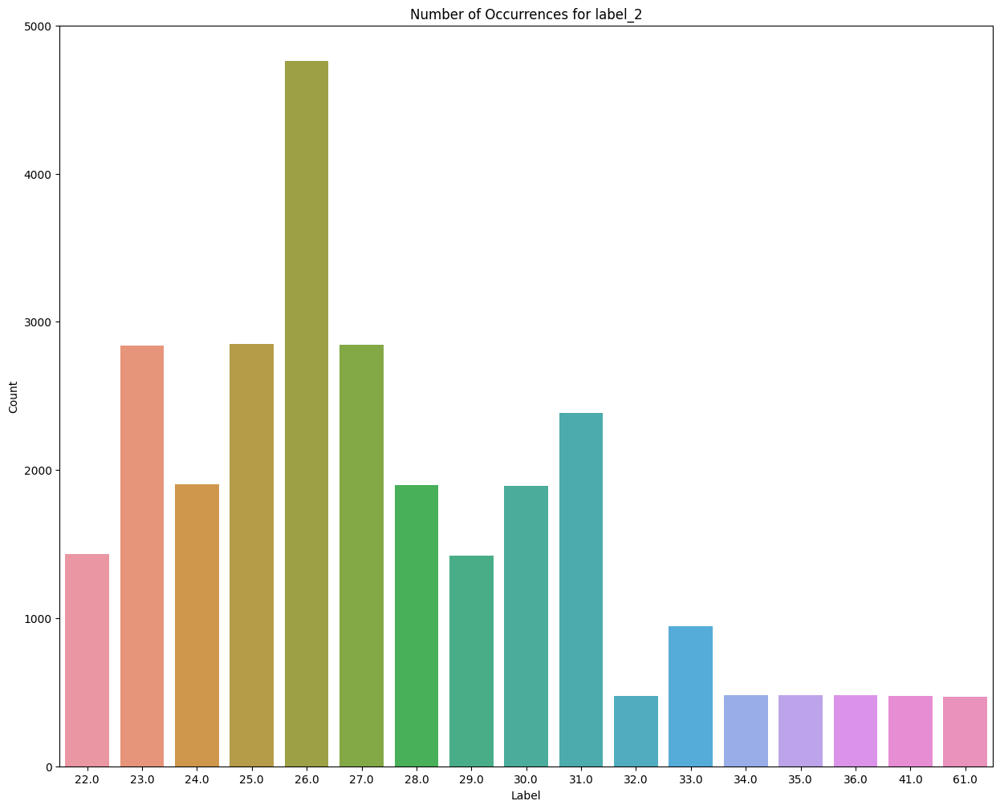

In [57]:
plt.figure(figsize=(15, 12))
sns.countplot(data=preprocessed_train_data, x='label_2')
plt.xlabel('Label')
plt.ylabel('Count')
plt.title('Number of Occurrences for label_2')
plt.show()

Now check the correlation between the features

In [58]:
X_train_label_2 = X_train.copy()
X_valid_label_2 = X_valid.copy()
X_test_label_2 = test_data.loc[:, 'feature_1':'feature_768'].copy()

In [59]:
corr_before_feature_engineering_label_2 = X_train_label_2.corr()

<Axes: >

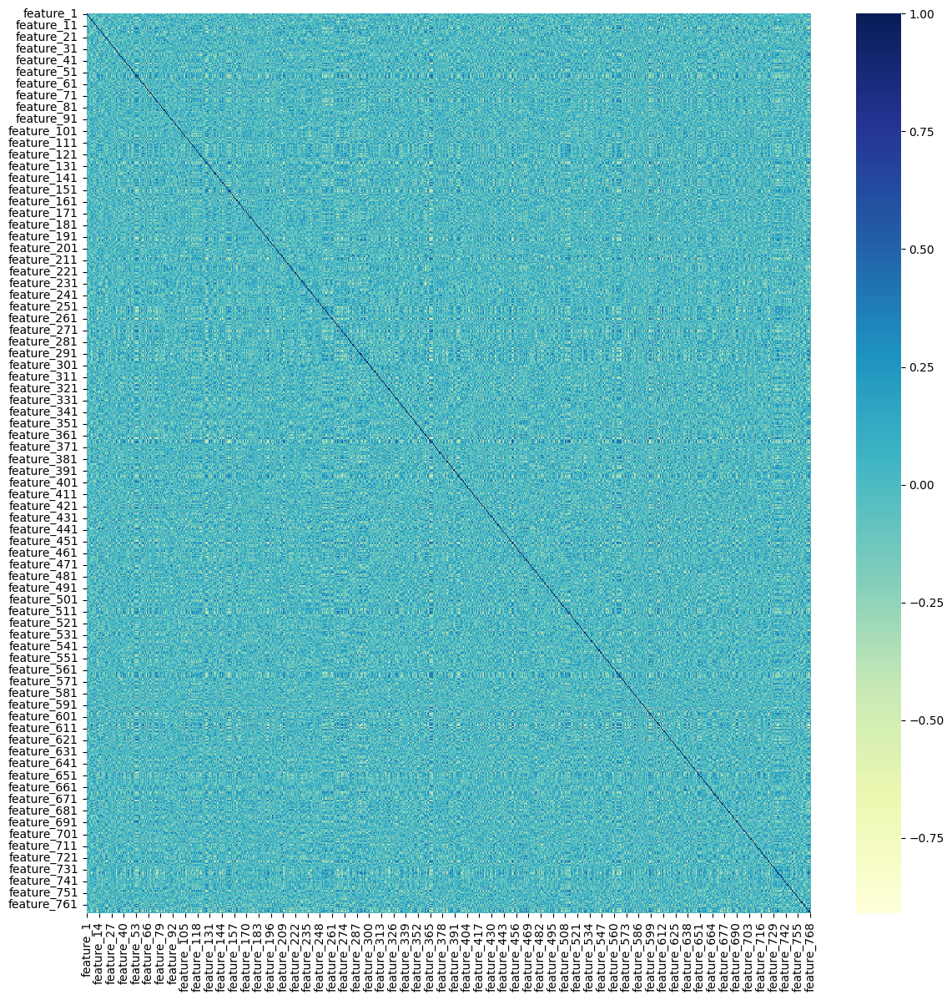

In [60]:
plt.figure(figsize=(14, 14))
plt.xticks(rotation=90)
sns.heatmap(corr_before_feature_engineering_label_2, cmap="YlGnBu")

Now select best model to predict 'Label_2'

In [61]:
score_knn = cross_val_score(KNeighborsClassifier(n_neighbors=5), X_train_label_2, Y_age_train,cv=3)
score_svm = cross_val_score(svm.SVC(kernel='linear', probability=True, class_weight='balanced'),X_train_label_2, Y_age_train,cv=3)
score_rfc = cross_val_score(RandomForestClassifier(n_estimators=5),X_train_label_2, Y_age_train, cv=3)
print(f"Score for knn: {score_knn}")
print(f"Score for svm: {score_svm}")
print(f"Score for RFC:{score_rfc}")

Score for knn: [0.29175136 0.42762384 0.30772523]
Score for svm: [0.27409864 0.38739703 0.29413653]
Score for RFC:[0.14357548 0.18176955 0.15257864]


Therefore best results are with KNN model. Lets consider both KNN and SVM models for predict Label 2.

First lets predict with KNN model

In [62]:
knn_label_2 = KNeighborsClassifier(n_neighbors=5)
knn_label_2.fit(X_train_label_2, Y_age_train)

KNeighborsClassifier()

In [63]:
y_predict_label_2 = knn_label_2.predict(X_valid_label_2)

In [64]:
print(metrics.confusion_matrix(Y_age_valid, y_predict_label_2))
print(metrics.accuracy_score(Y_age_valid, y_predict_label_2))
print(metrics.precision_score(Y_age_valid, y_predict_label_2, average = 'weighted'))
print(metrics.recall_score(Y_age_valid, y_predict_label_2, average = 'weighted'))

[[ 6  0  0  1  0  0  0  0  0  0  0  0  0  0]
 [ 1 13  1  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0 12  0  0  1  0  0  0  0  0  0  0  0]
 [ 0  0  0 17  1  0  0  0  1  0  0  0  0  0]
 [ 0  0  0  0 43  0  0  0  0  0  0  0  0  0]
 [ 0  1  0  0  0 28  0  0  0  0  0  0  0  0]
 [ 0  2  1  0  1  0 21  0  0  0  0  0  0  0]
 [ 0  0  0  0  3  0  0 22  0  0  0  0  0  0]
 [ 0  1  0  1  3  0  0  0 31  0  0  1  0  0]
 [ 0  0  0  1  0  0  0  0  0 31  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  1  0  0  0  0  0  0  0  0 10  0]
 [ 0  1  0  1  1  0  0  0  0  0  1  0  0 10]]
0.9037037037037037
0.9224424109840776
0.9037037037037037


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Lets do the hyper parameter tuning and find the best model by changing the parameters. I use PCA for feature reduction task

In [65]:
pipeline = Pipeline([
    ('pca', PCA()),
    ('knn', KNeighborsClassifier())
])

In [66]:
param_grid = {
    'pca__n_components': [0.93, 0.96, 0.99],  # Number of principal components
    'knn__n_neighbors': [3, 4, 5, 6, 7],    # Number of neighbors for KNN
    'knn__weights': ['distance'],
}

In [67]:
grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, cv=3, scoring='accuracy')
grid_search.fit(X_train, Y_age_train)

GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('pca', PCA()),
                                       ('knn', KNeighborsClassifier())]),
             param_grid={'knn__n_neighbors': [3, 4, 5, 6, 7],
                         'knn__weights': ['distance'],
                         'pca__n_components': [0.93, 0.96, 0.99]},
             scoring='accuracy')

In [68]:
# Get the best model and its hyperparameters
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_
best_score = grid_search.best_score_

In [69]:
best_params

{'knn__n_neighbors': 3, 'knn__weights': 'distance', 'pca__n_components': 0.99}

In [70]:
accuracy = best_model.score(X_valid, Y_age_valid)

In [71]:
accuracy

0.9074074074074074

In [72]:
y_pred_with_grid_search_label_2 = best_model.predict(X_valid)

In [73]:
print(metrics.confusion_matrix(Y_age_valid, y_pred_with_grid_search_label_2))
print(metrics.accuracy_score(Y_age_valid, y_pred_with_grid_search_label_2))
print(metrics.precision_score(Y_age_valid, y_pred_with_grid_search_label_2, average = 'weighted'))
print(metrics.recall_score(Y_age_valid, y_pred_with_grid_search_label_2, average = 'weighted'))

[[ 6  0  0  1  0  0  0  0  0  0  0  0  0]
 [ 1 13  1  0  0  0  0  0  0  0  0  0  0]
 [ 0  0 12  0  0  1  0  0  0  0  0  0  0]
 [ 0  0  1 16  0  0  0  0  1  1  0  0  0]
 [ 0  0  0  0 43  0  0  0  0  0  0  0  0]
 [ 0  1  0  0  0 28  0  0  0  0  0  0  0]
 [ 0  1  1  0  0  1 21  0  0  1  0  0  0]
 [ 0  0  0  0  3  0  0 22  0  0  0  0  0]
 [ 0  0  0  1  2  0  0  0 33  0  1  0  0]
 [ 0  0  0  1  0  0  0  0  0 31  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  1  0  0  0  0  0  0  0 10  0]
 [ 0  0  0  1  2  1  0  0  0  0  0  0 10]]
0.9074074074074074
0.9186004060362062
0.9074074074074074


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Now lets predict with SVM model

In [74]:
svc_label_2 = svm.SVC(kernel='rbf')
svc_label_2.fit(X_train_label_2, Y_age_train)

SVC()

In [75]:
y_predict_label_2 = svc_label_2.predict(X_valid_label_2)

In [76]:
print(metrics.confusion_matrix(Y_age_valid, y_predict_label_2))
print(metrics.accuracy_score(Y_age_valid, y_predict_label_2))
print(metrics.precision_score(Y_age_valid, y_predict_label_2, average = 'weighted'))
print(metrics.recall_score(Y_age_valid, y_predict_label_2, average = 'weighted'))

[[ 6  0  0  0  1  0  0  0  0  0  0  0  0]
 [ 0 12  0  0  1  0  1  0  1  0  0  0  0]
 [ 0  0 13  0  0  0  0  0  0  0  0  0  0]
 [ 0  2  0 15  0  0  1  0  0  1  0  0  0]
 [ 0  1  0  1 41  0  0  0  0  0  0  0  0]
 [ 0  0  0  2  4 22  0  0  0  0  1  0  0]
 [ 0  1  0  0  1  2 21  0  0  0  0  0  0]
 [ 0  0  0  0  2  0  0 23  0  0  0  0  0]
 [ 0  0  0  1  2  0  0  0 33  1  0  0  0]
 [ 0  1  0  0  2  0  0  0  0 29  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  1  0  0  0  0  0  0 10  0]
 [ 0  1  0  0  3  0  0  0  0  0  0  0 10]]
0.8703703703703703
0.8913082244105299
0.8703703703703703


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Lets do the hyper parameter tuning and find the best model by changing the parameters. I use PCA for feature reduction task

In [77]:
pipeline = Pipeline([
    ('pca', PCA()),
    ('svm', svm.SVC())
])

Check the perfoermance of the model by changing parameters in the following.

In [78]:
param_grid = {
    'pca__n_components': [0.96],
    'svm__C': [0.1, 1, 10, 20, 50, 55],         
    'svm__kernel': ['rbf'], 
    'svm__class_weight': ['balanced'],
    'svm__probability': [True]
}

In [79]:
grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, cv=3, scoring='accuracy')
grid_search.fit(X_train, Y_age_train)

GridSearchCV(cv=3, estimator=Pipeline(steps=[('pca', PCA()), ('svm', SVC())]),
             param_grid={'pca__n_components': [0.96], 'svm__C': [55],
                         'svm__class_weight': ['balanced'],
                         'svm__kernel': ['rbf'], 'svm__probability': [True]},
             scoring='accuracy')

In [80]:
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_
best_score = grid_search.best_score_

In [81]:
best_params

{'pca__n_components': 0.96,
 'svm__C': 55,
 'svm__class_weight': 'balanced',
 'svm__kernel': 'rbf',
 'svm__probability': True}

In [82]:
accuracy = best_model.score(X_valid, Y_age_valid)

In [83]:
accuracy

0.9481481481481482

In [84]:
y_pred_with_grid_search_label_2 = best_model.predict(X_valid)

In [85]:
print(metrics.confusion_matrix(Y_age_valid, y_pred_with_grid_search_label_2))
print(metrics.accuracy_score(Y_age_valid, y_pred_with_grid_search_label_2))
print(metrics.precision_score(Y_age_valid, y_pred_with_grid_search_label_2, average = 'weighted'))
print(metrics.recall_score(Y_age_valid, y_pred_with_grid_search_label_2, average = 'weighted'))

[[ 7  0  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0 14  1  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0 13  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  1  0 18  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0 43  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  1 27  0  0  0  0  1  0  0  0]
 [ 0  1  1  0  0  1 22  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0 25  0  0  0  0  0  0]
 [ 0  0  0  0  0  1  0  0 36  0  0  0  0  0]
 [ 0  0  0  1  0  0  0  0  0 31  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  1  0  0  0  0  0  0  0  0  0 10  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  2  0  0  0  0  1  0  0  0  0  0  1 10]]
0.9481481481481482
0.9602039592466747
0.9481481481481482


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Therefore, I could get a best result for SVM model by using hyper parameter tuning method.

Use explainable AI for label 2

In [39]:
def svc_predictor_label_2(X):
    return best_model.decision_function(X)

In [ ]:
explainer_label_2 = shap.Explainer(svc_predictor_label_2, X_train_label_2)
shap_values_label_2 = explainer_label_2.shap_values(X_valid_label_2)
shap.summary_plot(shap_values_label_2, X_valid_label_2, feature_names=X.columns)

In [86]:
y_predict_final_label_2 = best_model.predict(X_test_label_2)

# Find best classifier model for Label 3

In [30]:
train_data = pd.read_csv('/kaggle/input/speech-based-classification-layer-9/train.csv')
valid_data = pd.read_csv('/kaggle/input/speech-based-classification-layer-9/valid.csv')

In [31]:
# load data in Train dataset
X_train = train_data.loc[:, 'feature_1':'feature_768']
Y_gender_train = train_data['label_3']

In [32]:
# load data in Valid dataset
X_valid = valid_data.loc[:, 'feature_1':'feature_768']
Y_gender_valid = valid_data['label_3']

Check the nature of Label 3

In [33]:
Y_gender_train_df = Y_gender_train.to_frame()

In [34]:
Y_gender_train_df.describe()

,label_3
count,28520.000000
mean,0.799299
std,0.400532
min,0.000000
25%,1.000000
50%,1.000000
75%,1.000000
max,1.000000


In [35]:
robustScaler= RobustScaler()
X_train = pd.DataFrame(robustScaler.fit_transform(X_train))
X_valid = pd.DataFrame(robustScaler.fit_transform(X_valid))

Next check are there any null values in the Label 3 column.

In [36]:
null_values = Y_gender_train_df['label_3'].isnull()
null_count = null_values.sum()

print(f"Number of null values in 'label_3': {null_count}")

Number of null values in 'label_3': 0


Therefore there is not any null values. Now Let's check the value distribution with a graph.

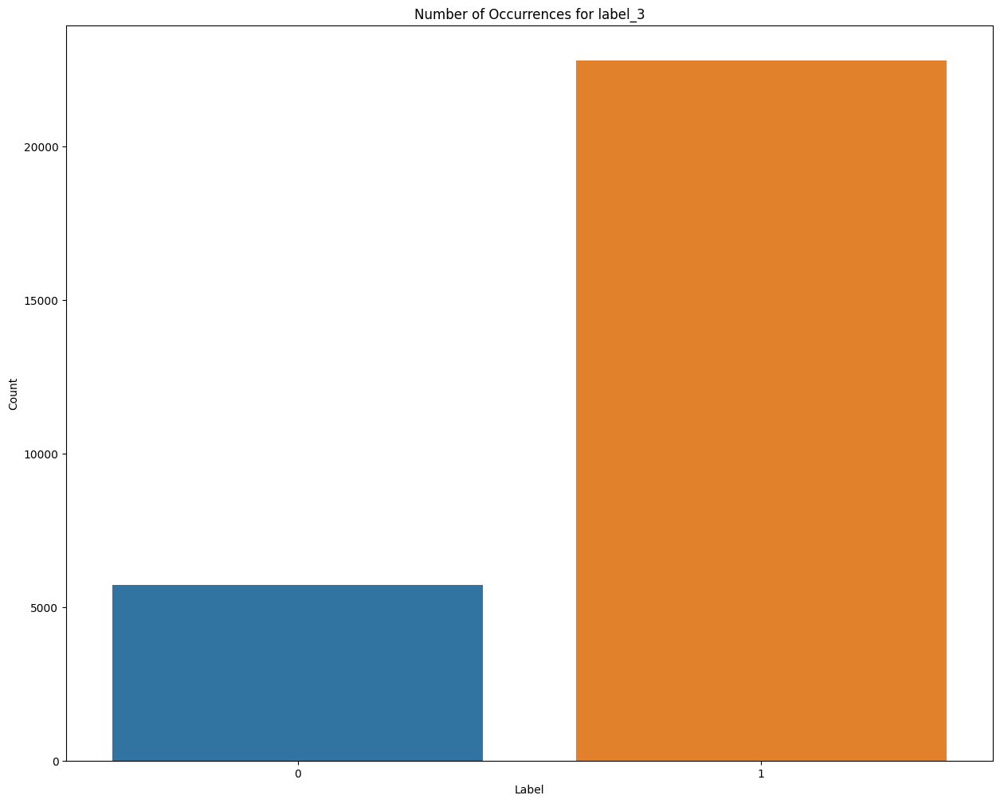

In [37]:
plt.figure(figsize=(15, 12))
sns.countplot(data=Y_gender_train_df, x='label_3')
plt.xlabel('Label')
plt.ylabel('Count')
plt.title('Number of Occurrences for label_3')
plt.show()

There is a bias in data to value "1". Lets try to oversample this

In [38]:
# # Initialize the RandomOverSampler
ros = RandomOverSampler(random_state=42)

In [39]:
# Fit and apply the resampling to your data
X_train_resampled, Y_gender_train_resampled = ros.fit_resample(X_train, Y_gender_train)

In [40]:
Y_gender_train_df = Y_gender_train_resampled.to_frame()

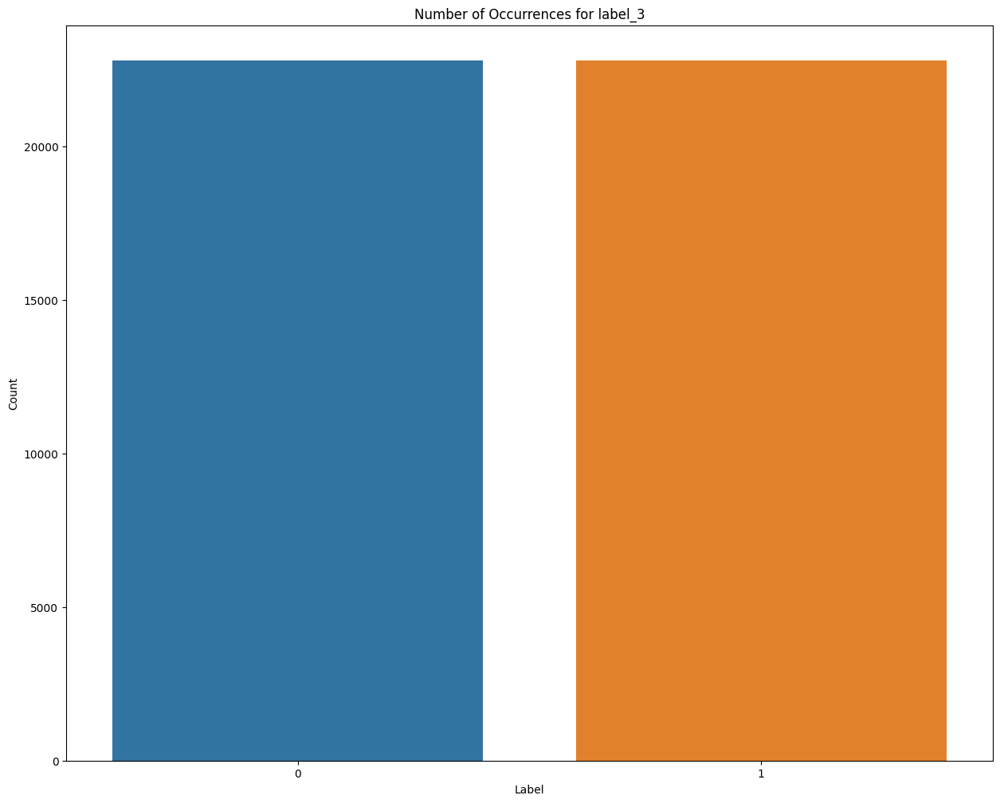

In [41]:
plt.figure(figsize=(15, 12))
sns.countplot(data=Y_gender_train_df, x='label_3')
plt.xlabel('Label')
plt.ylabel('Count')
plt.title('Number of Occurrences for label_3')
plt.show()

In [42]:
# # Update the values with resampled data
Y_gender_train = Y_gender_train_resampled

In [45]:
X_train_label_3 = X_train_resampled.copy()
X_valid_label_3 = X_valid.copy()
X_test_label_3 = test_data.loc[:, 'feature_1':'feature_768'].copy()

In [46]:
corr_before_feature_engineering_label_3 = X_train_label_3.corr()

<Axes: >

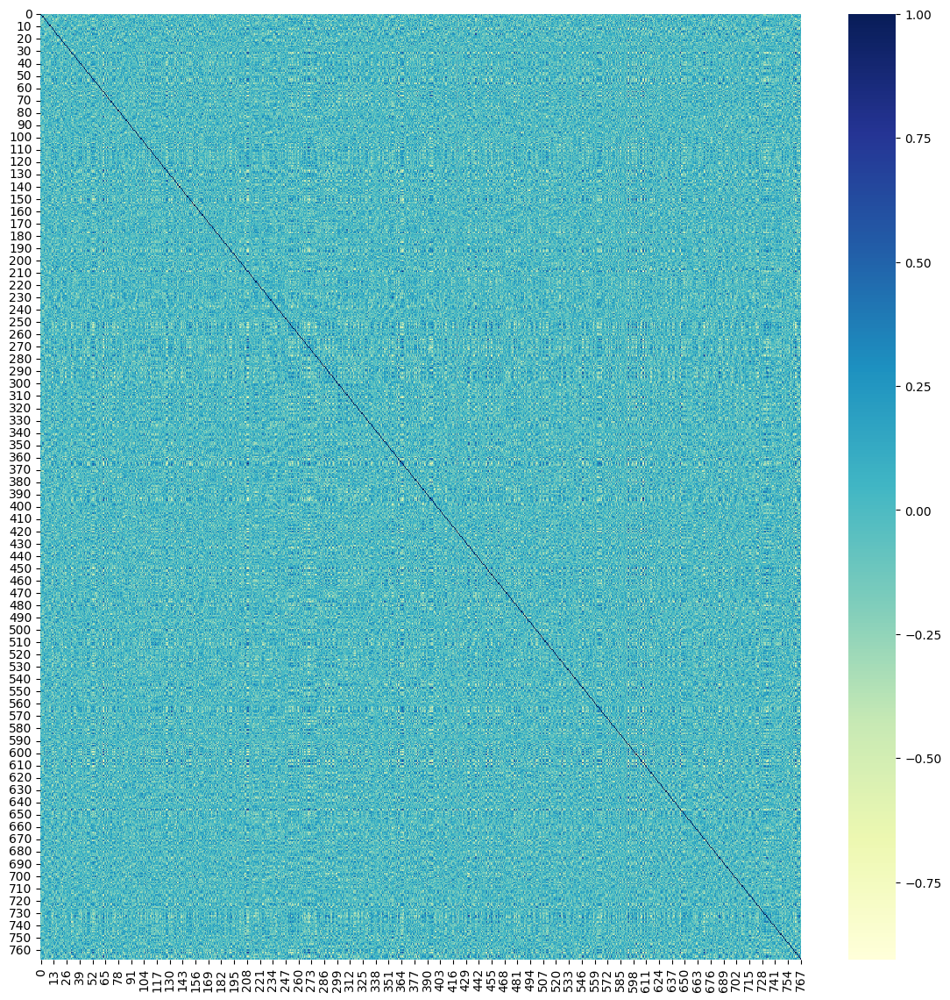

In [47]:
plt.figure(figsize=(14, 14))
plt.xticks(rotation=90)
sns.heatmap(corr_before_feature_engineering_label_3, cmap="YlGnBu")

Now select best model to predict 'Label_3'

In [50]:
score_knn = cross_val_score(KNeighborsClassifier(n_neighbors=5), X_train_label_3, Y_gender_train,cv=3)
score_svm = cross_val_score(svm.SVC(kernel='linear', probability=True, class_weight='balanced'),X_train_label_3, Y_gender_train,cv=3)
score_rfc = cross_val_score(RandomForestClassifier(n_estimators=5),X_train_label_3, Y_gender_train, cv=3)
print(f"Score for knn: {score_knn}")
print(f"Score for svm: {score_svm}")
print(f"Score for RFC:{score_rfc}")

Score for knn: [0.92064745 0.92208989 0.92814371]
Score for svm: [0.98973549 0.99348556 0.99776272]
Score for RFC:[0.96979866 0.96723037 0.97617951]


Therefore SVM model has the best value. Let's work with this model for further fine tuning tasks.

In [48]:
svc_label_3 = svm.SVC(kernel='linear', class_weight = 'balanced', probability = True)
svc_label_3.fit(X_train_label_3, Y_gender_train_df)

/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


SVC(class_weight='balanced', kernel='linear', probability=True)

In [49]:
y_predict_label_3 = svc_label_3.predict(X_valid_label_3)

In [50]:
print(metrics.confusion_matrix(Y_gender_valid, y_predict_label_3))
print(metrics.accuracy_score(Y_gender_valid, y_predict_label_3))
print(metrics.precision_score(Y_gender_valid, y_predict_label_3, average = 'weighted'))
print(metrics.recall_score(Y_gender_valid, y_predict_label_3, average = 'weighted'))

[[141   1]
 [  7 601]]
0.9893333333333333
0.9896984226751668
0.9893333333333333


Let's try to do the hyper parameter fine tuning with SVM model. I used PCA for fearure reduction.

In [51]:
pipeline = Pipeline([
    ('pca', PCA()),
    ('svm', svm.SVC())
])

In [52]:
param_grid = {
    'pca__n_components': [0.94],  # Number of principal components to retain
    'svm__C': [0.1, 1, 5, 9, 10],         # SVM regularization parameter
    'svm__kernel': ['linear', 'rbf'],         # SVM kernel
    'svm__class_weight': ['balanced'],
#     'svm__probability': [True]
}

In [53]:
grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, cv=3, scoring='accuracy')
grid_search.fit(X_train_label_3, Y_gender_train)

GridSearchCV(cv=3, estimator=Pipeline(steps=[('pca', PCA()), ('svm', SVC())]),
             param_grid={'pca__n_components': [0.94], 'svm__C': [9],
                         'svm__class_weight': ['balanced'],
                         'svm__kernel': ['rbf']},
             scoring='accuracy')

In [54]:
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_
best_score = grid_search.best_score_

In [55]:
best_params

{'pca__n_components': 0.94,
 'svm__C': 9,
 'svm__class_weight': 'balanced',
 'svm__kernel': 'rbf'}

In [56]:
accuracy = best_model.score(X_valid, Y_gender_valid)

In [57]:
accuracy

0.996

In [58]:
y_pred_with_grid_search_label_3 = best_model.predict(X_valid)

In [59]:
print(metrics.confusion_matrix(Y_gender_valid, y_pred_with_grid_search_label_3))
print(metrics.accuracy_score(Y_gender_valid, y_pred_with_grid_search_label_3))
print(metrics.precision_score(Y_gender_valid, y_pred_with_grid_search_label_3, average = 'weighted'))
print(metrics.recall_score(Y_gender_valid, y_pred_with_grid_search_label_3, average = 'weighted'))

[[141   1]
 [  2 606]]
0.996
0.9960164514233708
0.996


In [60]:
y_predict_final_label_3 = best_model.predict(X_test_label_3)

/opt/conda/lib/python3.10/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but PCA was fitted without feature names
  warnings.warn(


Use explainable AI for label 3

In [39]:
def svc_predictor_label_3(X):
    return best_model.decision_function(X)

In [ ]:
explainer_label_3 = shap.Explainer(svc_predictor_label_3, X_train_label_3)
shap_values_label_3 = explainer_label_3.shap_values(X_valid_label_3)
shap.summary_plot(shap_values_label_3, X_valid_label_3, feature_names=X.columns)

# Find best classifier model for Label 4

In [21]:
# load data in Train dataset
X_train = train_data.loc[:, 'feature_1':'feature_768']
Y_accent_train = train_data['label_4']

In [22]:
# load data in Valid dataset
X_valid = valid_data.loc[:, 'feature_1':'feature_768']
Y_accent_valid = valid_data['label_4']

In [23]:
Y_accent_train_df = Y_accent_train.to_frame()

Let's check the nature of the Label 4

In [24]:
Y_accent_train_df.describe()

,label_4
count,28520.000000
mean,5.997125
std,2.375567
min,0.000000
25%,6.000000
50%,6.000000
75%,6.000000
max,13.000000


In [25]:
robustScaler= RobustScaler()
X_train = pd.DataFrame(robustScaler.fit_transform(X_train))
X_valid = pd.DataFrame(robustScaler.fit_transform(X_valid))

Next check are there any null values in the Label 4 column.

In [26]:
null_values = Y_accent_train_df['label_4'].isnull()
null_count = null_values.sum()

print(f"Number of null values in 'label_4': {null_count}")

Number of null values in 'label_4': 0


Therefore there is not any null values. Now Let's check the value distribution with a graph.

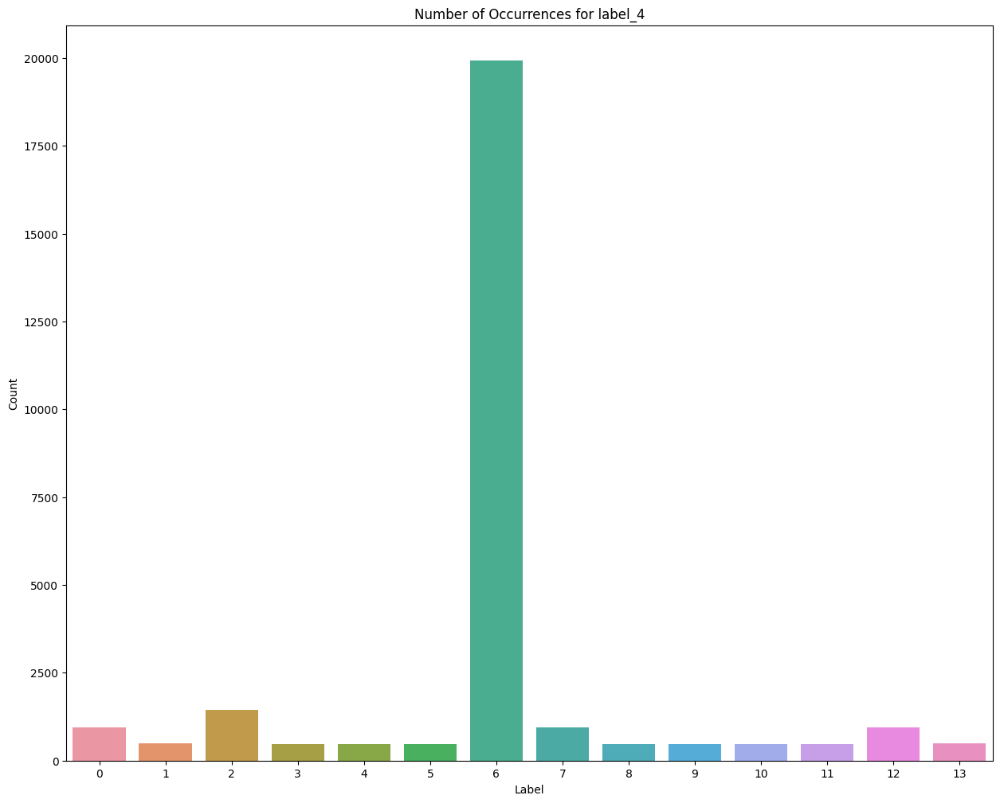

In [27]:
plt.figure(figsize=(15, 12))
sns.countplot(data=Y_accent_train_df, x='label_4')
plt.xlabel('Label')
plt.ylabel('Count')
plt.title('Number of Occurrences for label_4')
plt.show()

The dataset for Label 4 biased to value '6'. We need consider this for future evaluations. 

Resample data

In [28]:
# Apply Random Under-sampling
under_sampler = RandomOverSampler(sampling_strategy='auto', random_state=42)

In [29]:
# Fit and apply the pipeline to your data
X_train_resampled, Y_accent_resampled = under_sampler.fit_resample(X_train, Y_accent_train)

Value distribution after resampling

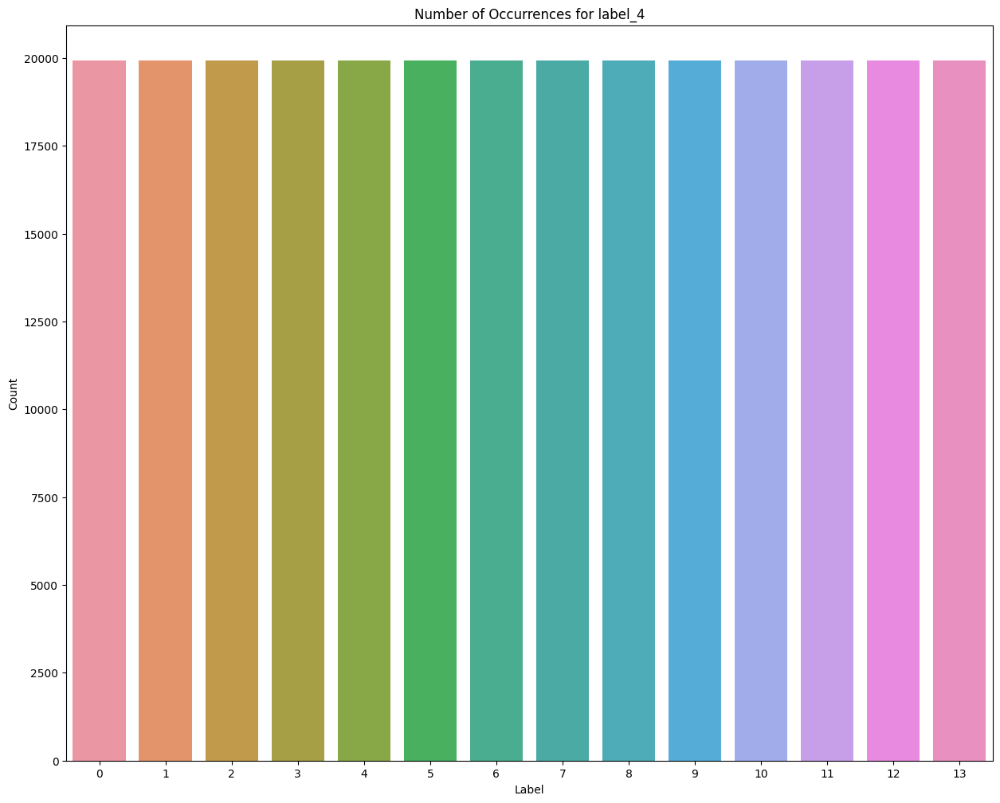

In [32]:
plt.figure(figsize=(15, 12))
sns.countplot(data=Y_accent_resampled.to_frame(), x='label_4')
plt.xlabel('Label')
plt.ylabel('Count')
plt.title('Number of Occurrences for label_4')
plt.show()

Now check the correlation between the features

In [33]:
X_train_label_4 = X_train_resampled.copy()
X_valid_label_4 = X_valid.copy()
X_test_label_4 = test_data.loc[:, 'feature_1':'feature_768'].copy()

In [34]:
corr_before_feature_engineering_label_4 = X_train_label_4.corr()

<Axes: >

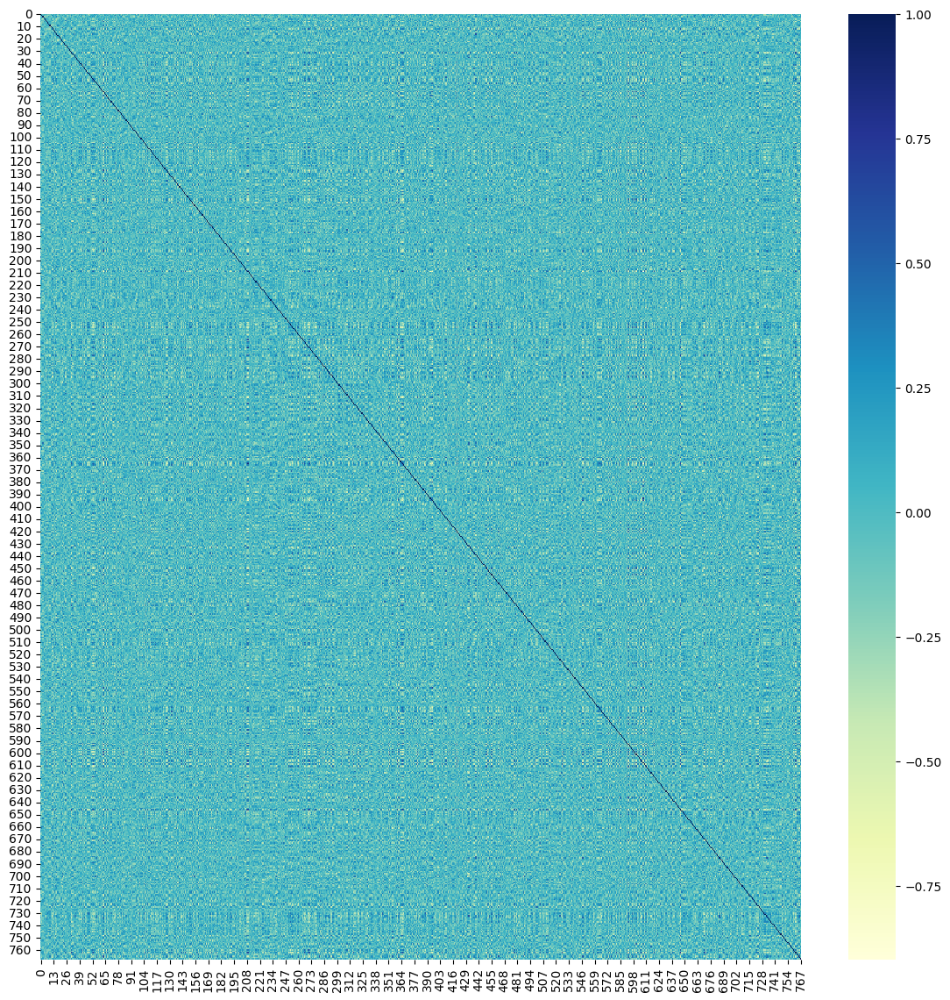

In [35]:
plt.figure(figsize=(14, 14))
plt.xticks(rotation=90)
sns.heatmap(corr_before_feature_engineering_label_4, cmap="YlGnBu")

Lets select best model for classification in Label 4

In [ ]:
score_knn = cross_val_score(KNeighborsClassifier(n_neighbors=10), X_train_label_4, Y_accent_resampled,cv=3)
score_svm = cross_val_score(svm.SVC(kernel='linear', probability=True, class_weight='balanced'),X_train_label_4, Y_accent_resampled,cv=3)
print(f"Score for knn: {score_knn}")
print(f"Score for svm: {score_svm}")

Because of both scores are close, lets consider both approaches

First lets consider about SVM classification

In [ ]:
svc_label_4 = svm.SVC(kernel='rbf', class_weight = 'balanced', probability = True)
svc_label_4.fit(X_train_label_4, Y_accent_resampled)

In [ ]:
y_predict_label_4 = svc_label_4.predict(X_valid_label_4)

In [ ]:
print(metrics.confusion_matrix(Y_accent_valid, y_predict_label_4))
print(metrics.accuracy_score(Y_accent_valid, y_predict_label_4))
print(metrics.precision_score(Y_accent_valid, y_predict_label_4, average = 'weighted'))
print(metrics.recall_score(Y_accent_valid, y_predict_label_4, average = 'weighted'))

Lets do hyper parameter fine tuning for find best model for Label 4. I used PCA for feature reduction.

In [ ]:
pipeline = Pipeline([
    ('pca', PCA()),
    ('svm', svm.SVC())
])

Changed values and found model with the best resuls

In [ ]:
param_grid = {
    'pca__n_components': [0.95],  # Number of principal components to retain
    'svm__C': [0.1, 1, 10],         # SVM regularization parameter
    'svm__kernel': ['rbf'],         # SVM kernel
    'svm__class_weight': ['balanced'],
#     'svm__probability': [True]
}

In [ ]:
# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, cv=3, scoring='accuracy')
grid_search.fit(X_train_resampled, Y_accent_resampled)

In [ ]:
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_
best_score = grid_search.best_score_

In [ ]:
best_params

In [ ]:
accuracy = best_model.score(X_valid, Y_accent_valid)

In [ ]:
y_pred_with_grid_search_label_4 = best_model.predict(X_valid)

In [ ]:
print(metrics.confusion_matrix(Y_accent_valid, y_pred_with_grid_search_label_4))
print(metrics.accuracy_score(Y_accent_valid, y_pred_with_grid_search_label_4))
print(metrics.precision_score(Y_accent_valid, y_pred_with_grid_search_label_4, average = 'weighted'))
print(metrics.recall_score(Y_accent_valid, y_pred_with_grid_search_label_4, average = 'weighted'))

Use explainable AI for label 4

In [39]:
def svc_predictor_label_4(X):
    return best_model.decision_function(X)

In [ ]:
explainer_label_4 = shap.Explainer(svc_predictor_label_4, X_train_label_4)
shap_values_label_4 = explainer_label_4.shap_values(X_valid_label_4)
shap.summary_plot(shap_values_label_4, X_valid_label_4, feature_names=X.columns)

In [ ]:
saveModel("pca__n_0.90_svm__C_18_svm__kernel_rbf", best_model)

In [ ]:
y_predict_final_label_4 = best_model.predict(X_test_label_4)

Now lets classify with KNN for label 4

In [ ]:
knn_label_4 = KNeighborsClassifier(n_neighbors=5)
knn_label_4.fit(X_train_resampled, Y_accent_resampled)

In [ ]:
y_predict_label_4 = knn_label_4.predict(X_valid_label_4)

In [ ]:
print(metrics.confusion_matrix(Y_accent_valid, y_predict_label_4))
print(metrics.accuracy_score(Y_accent_valid, y_predict_label_4))
print(metrics.precision_score(Y_accent_valid, y_predict_label_4, average = 'weighted'))
print(metrics.recall_score(Y_accent_valid, y_predict_label_4, average = 'weighted'))

Lets do the hyper parameter tuning and find the best model by changing the parameters. I use PCA for feature reduction task

In [ ]:
pipeline = Pipeline([
    ('pca', PCA()),
    ('knn', KNeighborsClassifier())
])

Check best model by changinge following parameters

In [ ]:
# Define the parameter grid for grid search
param_grid = {
    'pca__n_components': [0.95]
    'knn__n_neighbors': [5, 10, 20],  
    'knn__weights': ['distance'],
}

In [ ]:
grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, cv=3, scoring='accuracy')
grid_search.fit(X_train_resampled, Y_accent_resampled)

In [ ]:
best_model_knn = grid_search.best_estimator_
best_params_knn = grid_search.best_params_
best_score_knn = grid_search.best_score_

In [ ]:
best_params_knn

In [ ]:
accuracy_knn = best_model_knn.score(X_valid, Y_accent_valid)

In [ ]:
accuracy_knn

In [ ]:
y_pred_with_grid_search_label_4_knn = best_model_knn.predict(X_valid)

In [ ]:
print(metrics.confusion_matrix(Y_accent_valid, y_pred_with_grid_search_label_4_knn))
print(metrics.accuracy_score(Y_accent_valid, y_pred_with_grid_search_label_4_knn))
print(metrics.precision_score(Y_accent_valid, y_pred_with_grid_search_label_4_knn, average = 'weighted'))
print(metrics.recall_score(Y_accent_valid, y_pred_with_grid_search_label_4_knn, average = 'weighted'))

# Combine All Results

In [ ]:
final_result_all = pd.concat([test_data['ID'], pd.Series(y_predict_final_label_1, name='label_1'), pd.Series(y_predict_final_label_2, name='label_2'), pd.Series(y_predict_final_label_3, name='label_3'), pd.Series(y_predict_final_label_4, name='label_4')], axis=1)

In [ ]:
final_result_all

In [ ]:
final_result_all.to_csv('190050K layer 9 new.csv', index=False)